In [1]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 752.1/752.1 kB 7.2 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [2]:
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

In [3]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="wnoIPiLCVfXbu4zHFBpX")
project = rf.workspace("istanbul-technical-university-ogddi").project("ecovision_yolov5")
version = project.version(1)
dataset = version.download("yolov5")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.4 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.7
    Uninstalling idna-3.7:
      Successfully uninstalled idna-3.7
  Attempting uninstall: cycler
    Found existing installation: cycler 0.12.1
    Uninstalling cycler-0.12.1:
      Successfully uninstalled cycler-0.12

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to EcoVision_Yolov5-1 in yolov5pytorch:: 100%|██████████| 11258/11258 [00:02<00:00, 3866.39it/s]


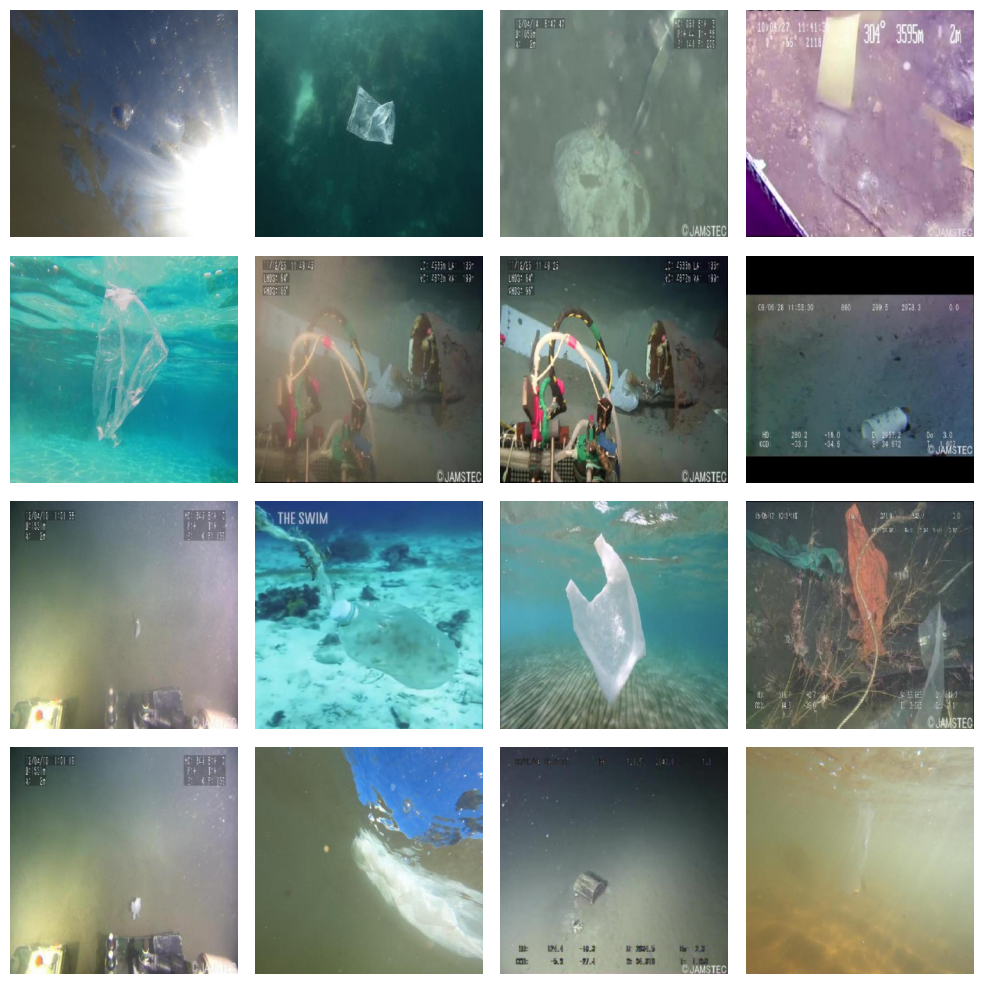

In [4]:
# Path to the folder containing images
image_folder = '/content/EcoVision_Yolov5-1/test/images'

# Get a list of all image files in the folder
image_files = [f for f in os.listdir(image_folder) if f.endswith('.jpg')]

# Randomly select 16 images
selected_images = random.sample(image_files, 16)

# Create a 4 by 4 grid of subplots
fig, axes = plt.subplots(4, 4, figsize=(10, 10))

# Iterate through the selected images and display them on the grid
for i, ax in enumerate(axes.flat):
    img_path = os.path.join(image_folder, selected_images[i])
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.axis('off')

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


In [5]:
import os

# Path to the main folders
main_folders = [
    '/content/EcoVision_Yolov5-1/train',
    '/content/EcoVision_Yolov5-1/test',
    '/content/EcoVision_Yolov5-1/valid'
]

# Iterate through each main folder
for main_folder in main_folders:
    print(f"\nMain Folder: {main_folder}")

    # Subfolders under the main folder (images and labels)
    subfolders = ['images', 'labels']

    # Iterate through each subfolder
    for subfolder in subfolders:
        # Full path to the subfolder
        subfolder_path = os.path.join(main_folder, subfolder)

        # Count the number of files in the subfolder
        file_count = len(os.listdir(subfolder_path))

        # Print the results
        print(f"  {subfolder.capitalize()} Folder: {file_count} files")


Main Folder: /content/EcoVision_Yolov5-1/train
  Images Folder: 3306 files
  Labels Folder: 3306 files

Main Folder: /content/EcoVision_Yolov5-1/test
  Images Folder: 1106 files
  Labels Folder: 1106 files

Main Folder: /content/EcoVision_Yolov5-1/valid
  Images Folder: 1211 files
  Labels Folder: 1211 files


In [6]:
import yaml

# Specify the path to the YAML file
yaml_file_path = '/content/EcoVision_Yolov5-1/data.yaml'

# Load the YAML file
with open(yaml_file_path, 'r') as file:
    data = yaml.safe_load(file)

# Extract and display the class names
class_names = data['names']
print("Class Names:", class_names)

Class Names: ['trash_plastic']


In [7]:
import os
import random
from PIL import Image  # Using the Python Imaging Library

# Path to the images folder
images_folder = '/content/EcoVision_Yolov5-1/test/images'

# Get a list of all image files in the folder
image_files = [f for f in os.listdir(images_folder) if f.endswith(('.jpg', '.png', '.jpeg'))]

# Choose a random image from the list
random_image = random.choice(image_files)

# Construct the full path to the random image
random_image_path = os.path.join(images_folder, random_image)

# Open the image using PIL
image = Image.open(random_image_path)

# Get the size, mode (channels), and number of channels of the image
image_size = image.size
image_mode = image.mode
num_channels = image.layers if hasattr(image, 'layers') else len(image.getbands())

# Print the details of the random image
print(f"Random Image: {random_image}")
print(f"Image Size: {image_size}")
print(f"Image Mode (Channels): {image_mode}")
print(f"Number of Channels: {num_channels}")


Random Image: vid_000255_frame0000081_jpg.rf.24fcfe1688b8f13341b0324a2e29661f.jpg
Image Size: (640, 640)
Image Mode (Channels): RGB
Number of Channels: 3


100%|██████████| 6.23M/6.23M [00:00<00:00, 92.4MB/s]



image 1/1 /content/EcoVision_Yolov5-1/train/images/vid_000158_frame0000098_jpg.rf.045e0f25a05c8b4970babf5a475c56a4.jpg: 416x416 (no detections), 352.0ms
Speed: 8.7ms preprocess, 352.0ms inference, 2825.3ms postprocess per image at shape (1, 3, 416, 416)


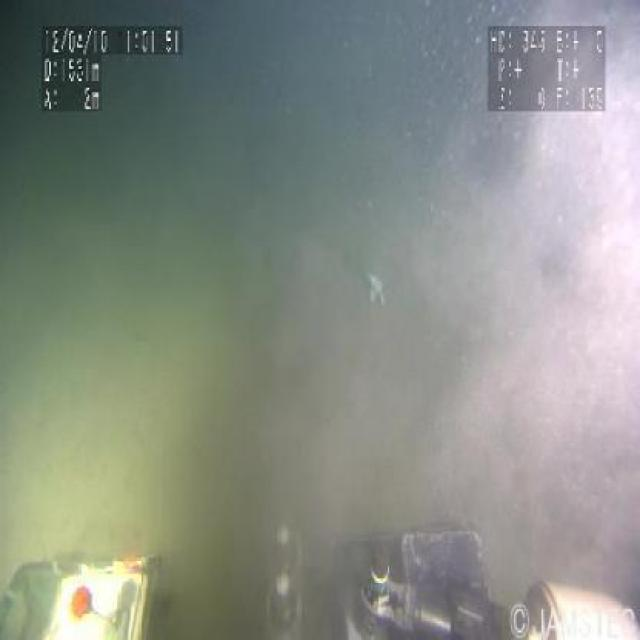

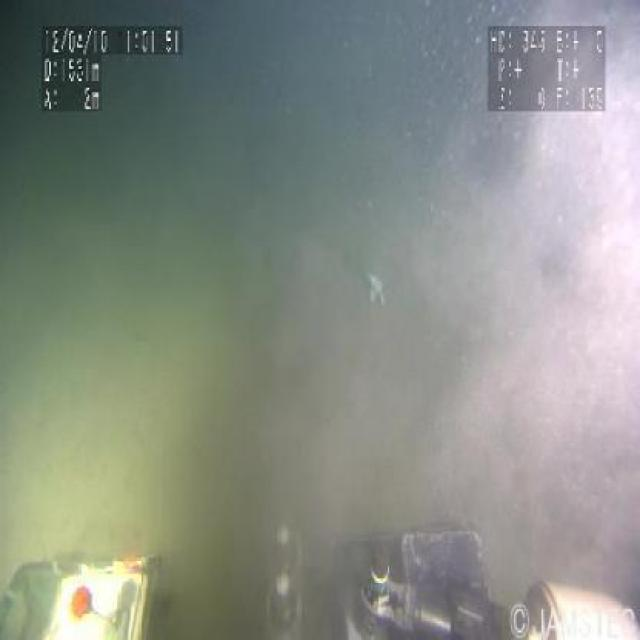


image 1/1 /content/EcoVision_Yolov5-1/train/images/frame_01300_png_jpg.rf.2c0c47565e778cefe6953d2baf91c56e.jpg: 416x416 (no detections), 132.5ms
Speed: 4.8ms preprocess, 132.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 416)


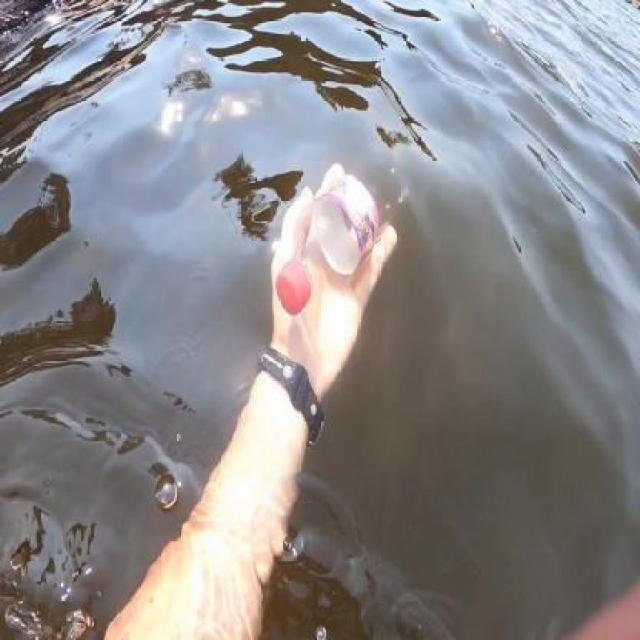

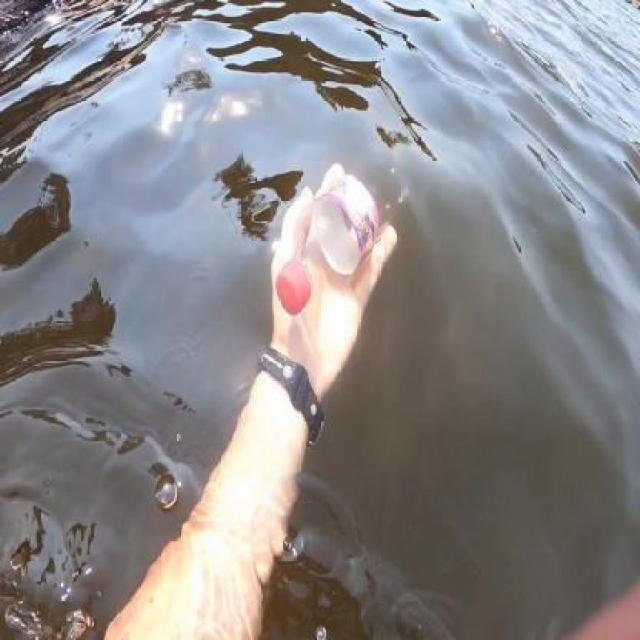


image 1/1 /content/EcoVision_Yolov5-1/train/images/frame_00930_png_jpg.rf.7165793f15a81cb1e8748fa7e2afc8e7.jpg: 416x416 (no detections), 170.2ms
Speed: 4.4ms preprocess, 170.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 416)


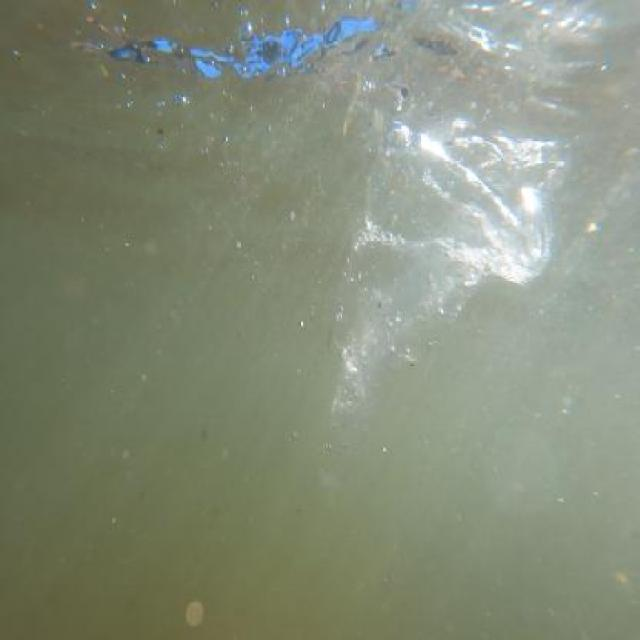

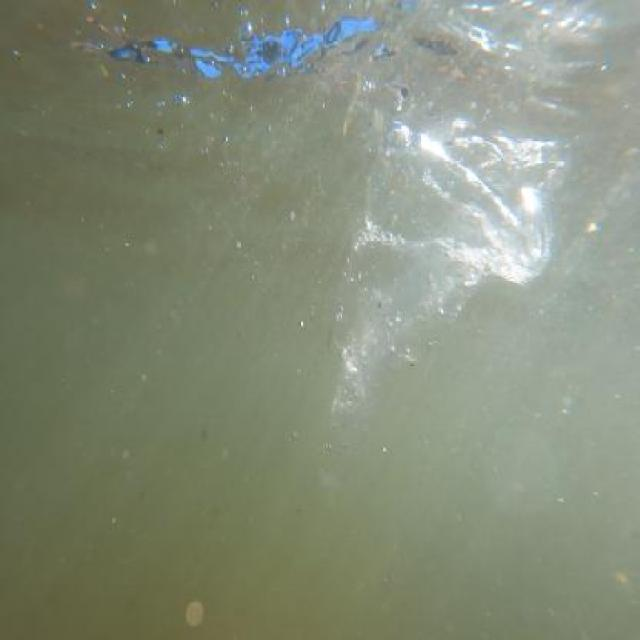


image 1/1 /content/EcoVision_Yolov5-1/train/images/frame_00275_png_jpg.rf.2c0f862e417ce1a33d57658b949f2d6b.jpg: 416x416 (no detections), 137.5ms
Speed: 3.1ms preprocess, 137.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 416)


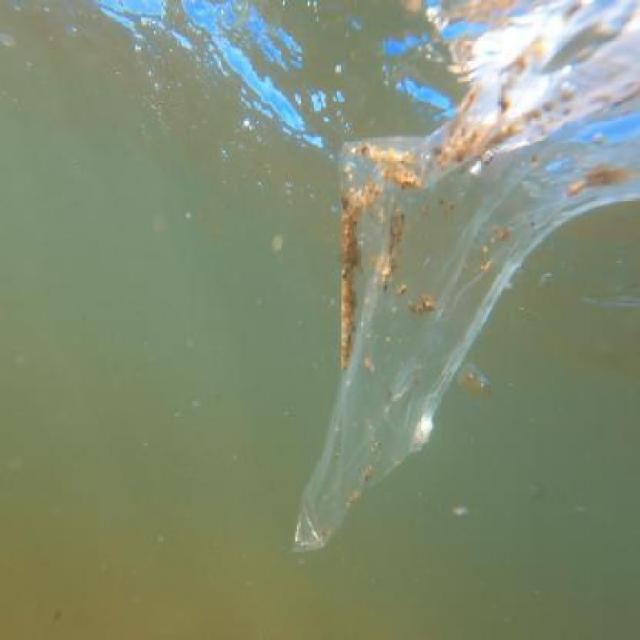

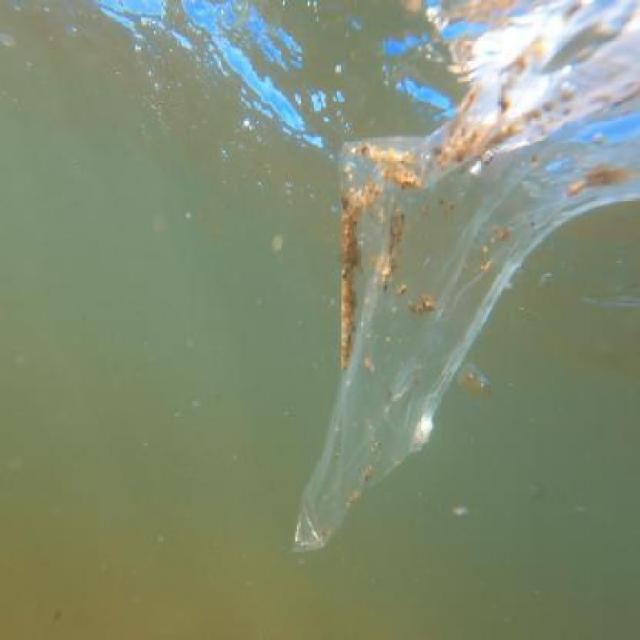

In [8]:
from PIL import Image, ImageDraw
from IPython.display import display


# Path to the images folder
images_folder = '/content/EcoVision_Yolov5-1/train/images'

# Get a list of all image files in the folder
image_files = [f for f in os.listdir(images_folder) if f.endswith(('.jpg', '.png', '.jpeg'))]

# Choose four random images from the list
random_images = random.sample(image_files, 4)

# Use a pretrained YOLOv8n model
model = YOLO("yolov8n.pt")

# Loop through the selected images and show prediction results
for image_file in random_images:
    # Construct the full path to the image
    image_path = os.path.join(images_folder, image_file)

    # Use the model to detect objects
    result_predict = model.predict(source=image_path, imgsz=(416))

    # Display the original image
    original_image = Image.open(image_path)
    display(original_image)

    # Display the prediction results
    for result in result_predict:
        plot = result.plot()
        plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
        display(Image.fromarray(plot))

In [ ]:
Final_model = YOLO('yolov8n.yaml').load('yolov8n.pt')

Result_Final_model = Final_model.train(data="/content/EcoVision_Yolov5-1/data.yaml", epochs=30, imgsz=416, batch=16, lr0=0.001, dropout=0.1, device='cpu')


Transferred 355/355 items from pretrained weights
Ultralytics YOLOv8.2.4 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/content/EcoVision_Yolov5-1/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.1, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False

100%|██████████| 755k/755k [00:00<00:00, 24.1MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/EcoVision_Yolov5-1/train/labels... 3306 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3306/3306 [00:01<00:00, 1851.98it/s]


train: New cache created: /content/EcoVision_Yolov5-1/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/EcoVision_Yolov5-1/valid/labels... 1211 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1211/1211 [00:00<00:00, 1992.28it/s]


val: New cache created: /content/EcoVision_Yolov5-1/valid/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 0 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30         0G      1.661      2.105      1.521         38        416: 100%|██████████| 207/207 [18:28<00:00,  5.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [02:45<00:00,  4.36s/it]


                   all       1211       1738      0.457      0.406      0.399      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30         0G      1.749      1.845       1.59         28        416: 100%|██████████| 207/207 [18:41<00:00,  5.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  87%|████████▋ | 33/38 [02:30<00:23,  4.72s/it]

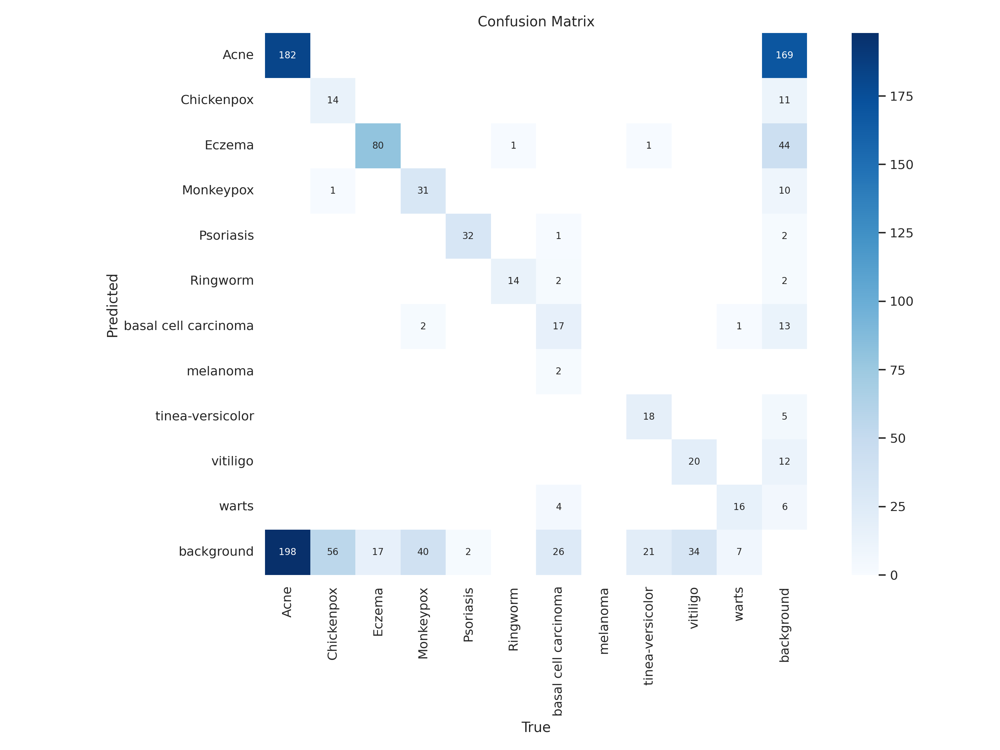

In [ ]:
from IPython.display import Image, display

# Specify the path to the image
image_path = '/content/runs/detect/train/confusion_matrix.png'

# Display the image
display(Image(filename=image_path))

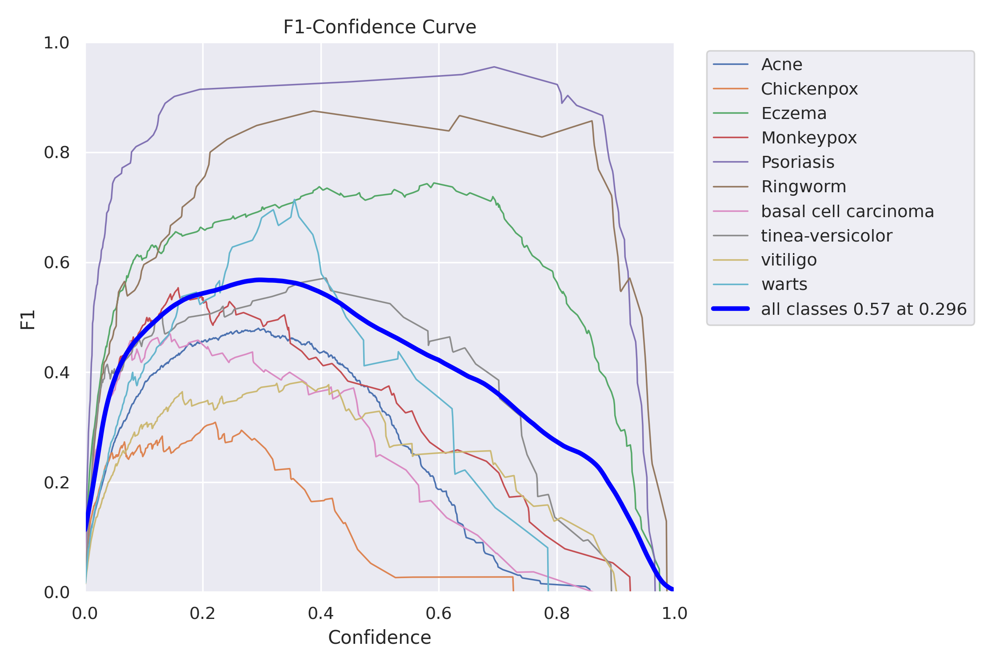

In [ ]:
from IPython.display import Image, display

# Specify the path to the image
image_path = '/content/runs/detect/train/F1_curve.png'

# Display the image
display(Image(filename=image_path))

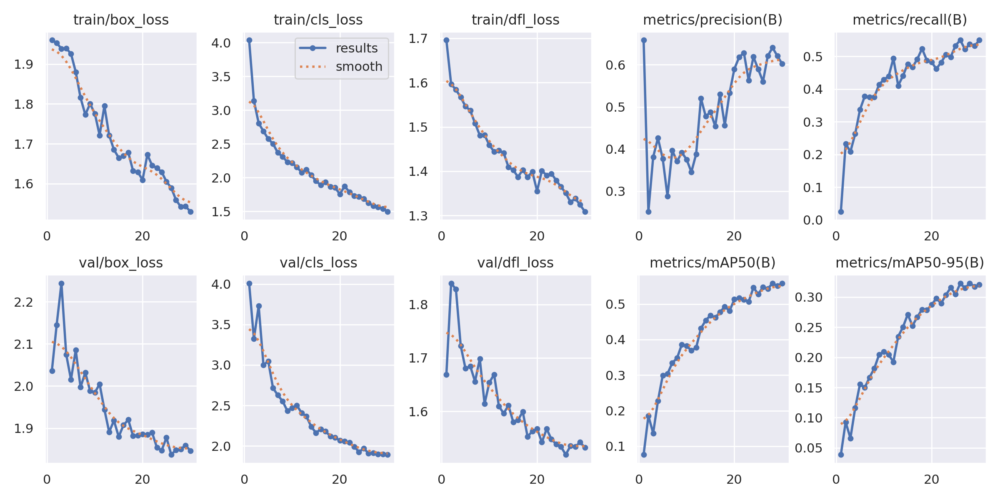

In [ ]:
from IPython.display import Image, display

# Specify the path to the image
image_path = '/content/runs/detect/train/results.png'

# Display the image
display(Image(filename=image_path))

In [ ]:
# Loading the best performing model
best_model = YOLO('/content/runs/detect/train/weights/best.pt')

# Evaluating the model on the testset
metrics = best_model.val(split = 'test')

Ultralytics YOLOv8.2.1 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8n summary (fused): 168 layers, 3007793 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/Skin-1/test/labels... 185 images, 0 backgrounds, 0 corrupt: 100%|██████████| 185/185 [00:00<00:00, 333.49it/s]

val: New cache created: /content/Skin-1/test/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 101, len(boxes) = 967. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:33<00:00,  2.79s/it]


                   all        185        967      0.521      0.501      0.488      0.275
                  Acne        185        622      0.557      0.402      0.454      0.146
            Chickenpox        185         54      0.208     0.0926     0.0976     0.0384
                Eczema        185         57        0.5      0.614        0.5      0.252
             Monkeypox        185         34      0.374      0.235      0.253     0.0948
             Psoriasis        185         29      0.778      0.931      0.955      0.765
              Ringworm        185         68      0.666      0.498      0.583       0.36
  basal cell carcinoma        185         31      0.527      0.387      0.377      0.201
      tinea-versicolor        185         28      0.661      0.857      0.852      0.516
              vitiligo        185         34      0.541       0.59      0.439      0.157
                 warts        185         10      0.401        0.4      0.364      0.221
Speed: 1.8ms preproce


0: 416x416 1 Acne, 158.1ms
Speed: 3.9ms preprocess, 158.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


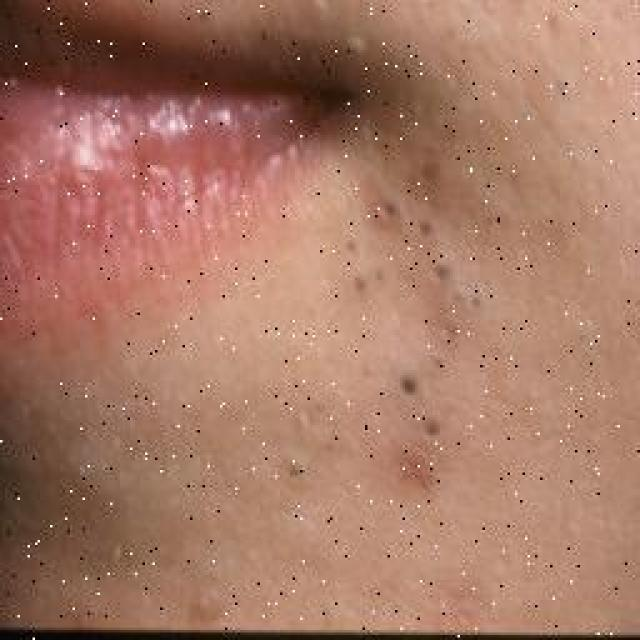

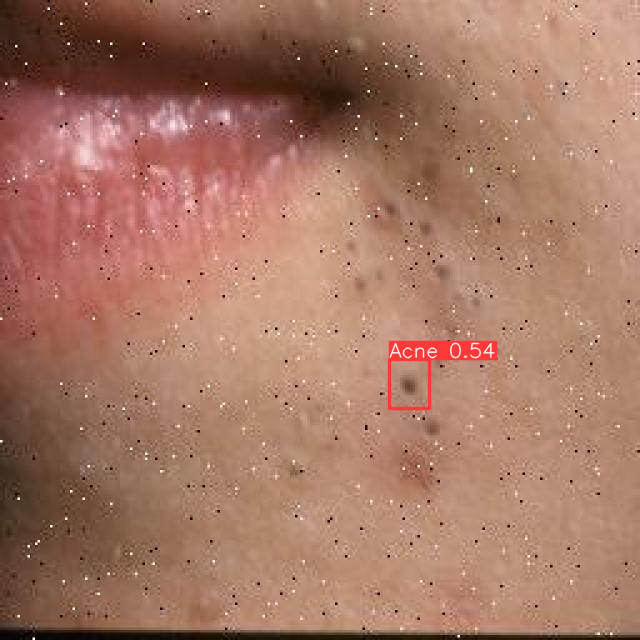


0: 416x416 2 Psoriasiss, 181.9ms
Speed: 3.9ms preprocess, 181.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


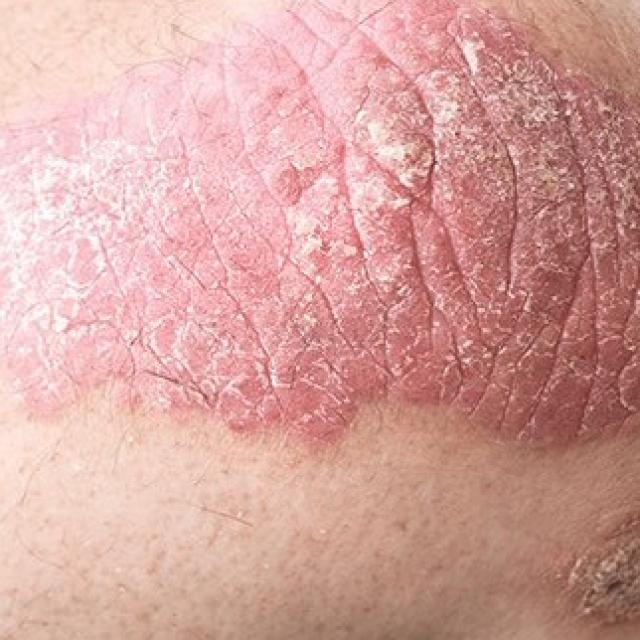

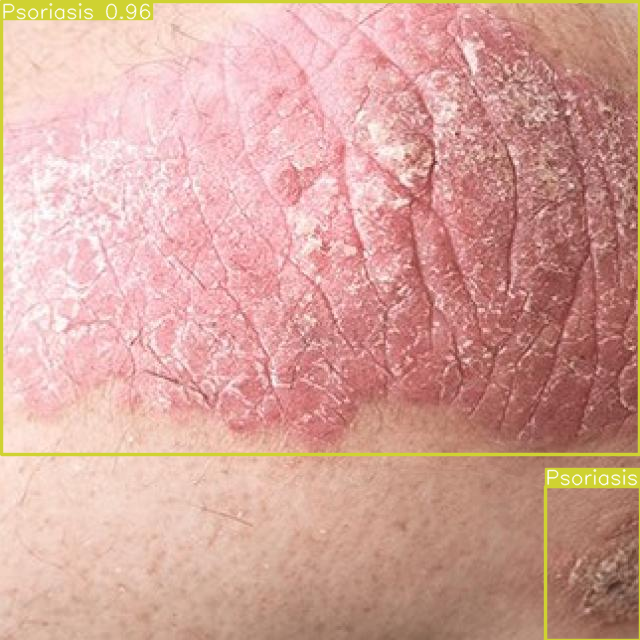


0: 416x416 1 Ringworm, 158.3ms
Speed: 2.7ms preprocess, 158.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)


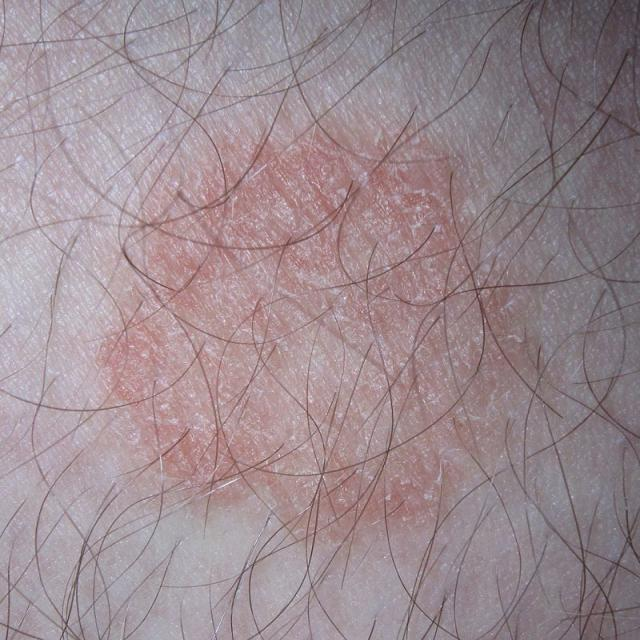

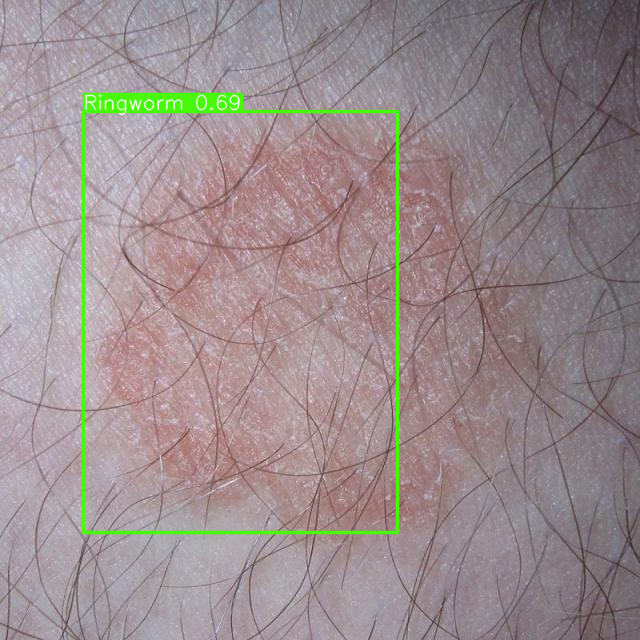


0: 416x416 1 Psoriasis, 157.7ms
Speed: 3.0ms preprocess, 157.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


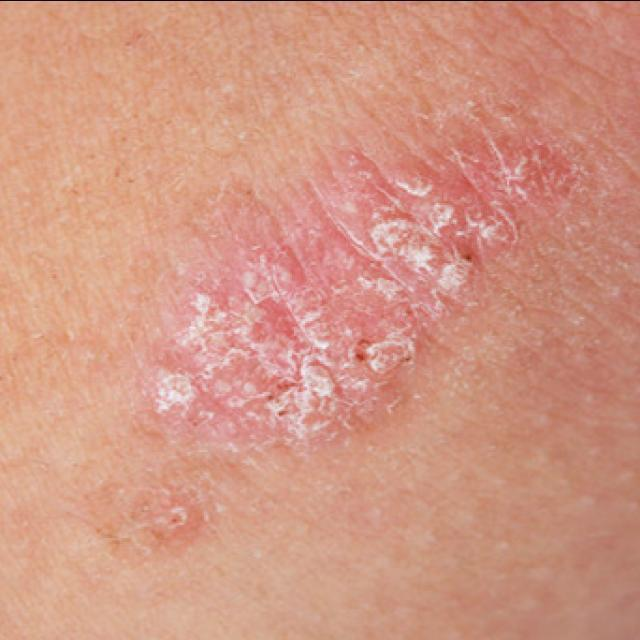

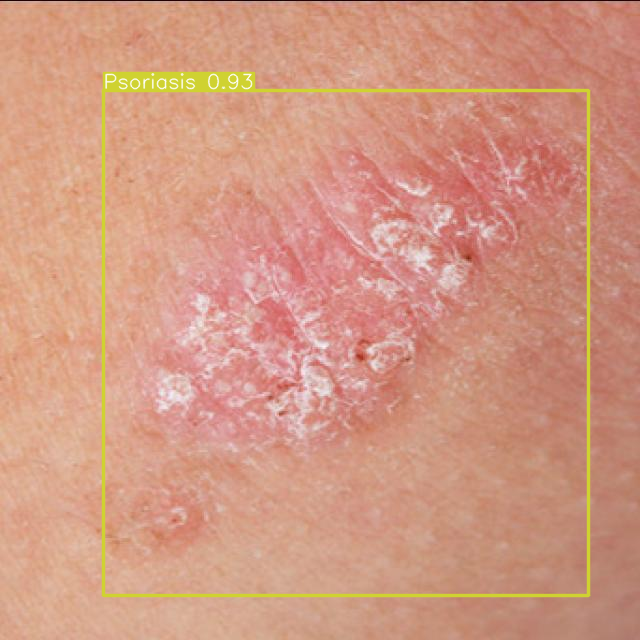


0: 416x416 1 warts, 156.7ms
Speed: 2.7ms preprocess, 156.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)


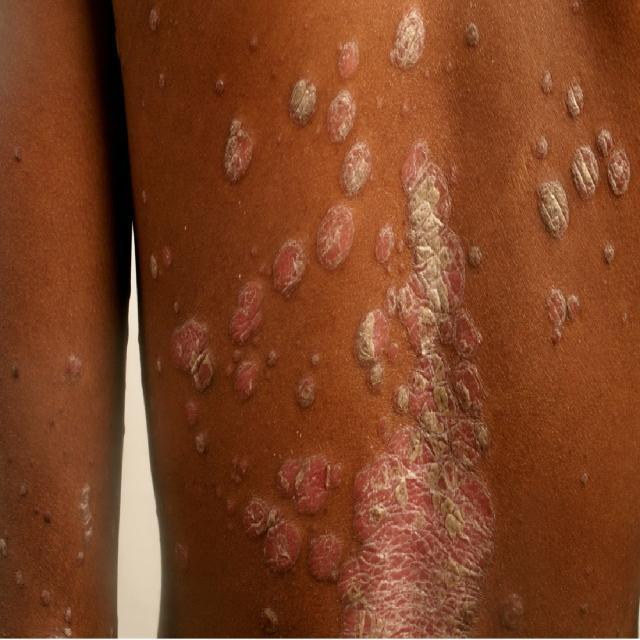

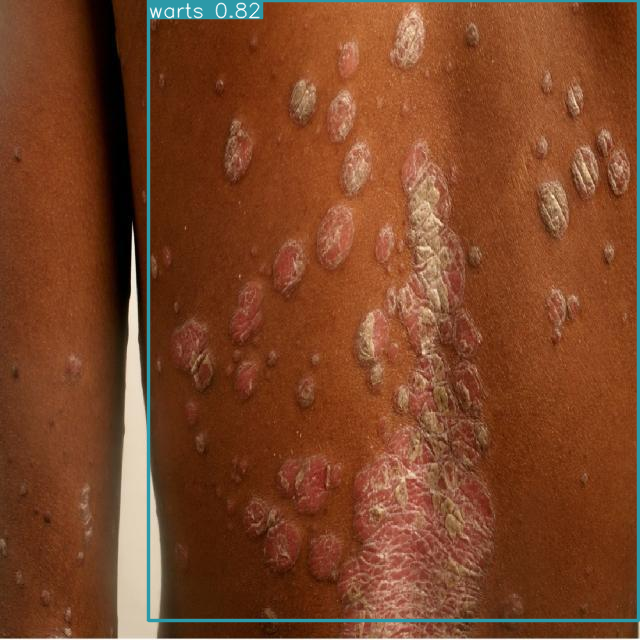


0: 416x416 1 Eczema, 164.2ms
Speed: 5.1ms preprocess, 164.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)


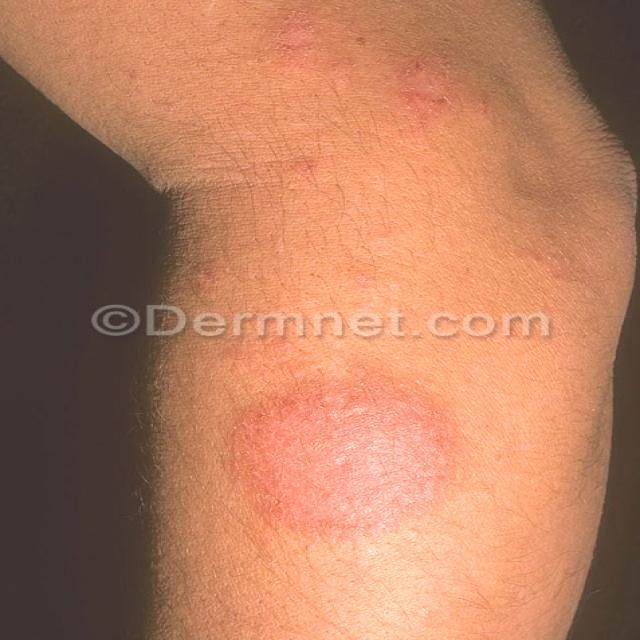

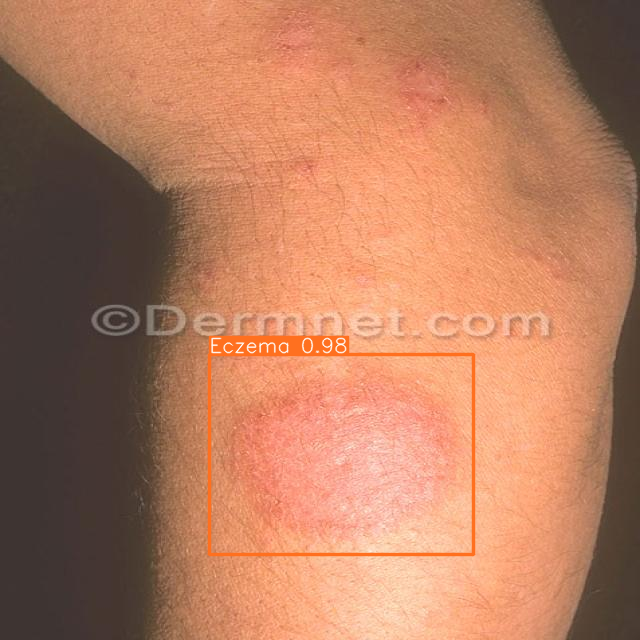


0: 416x416 1 tinea-versicolor, 171.4ms
Speed: 2.9ms preprocess, 171.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


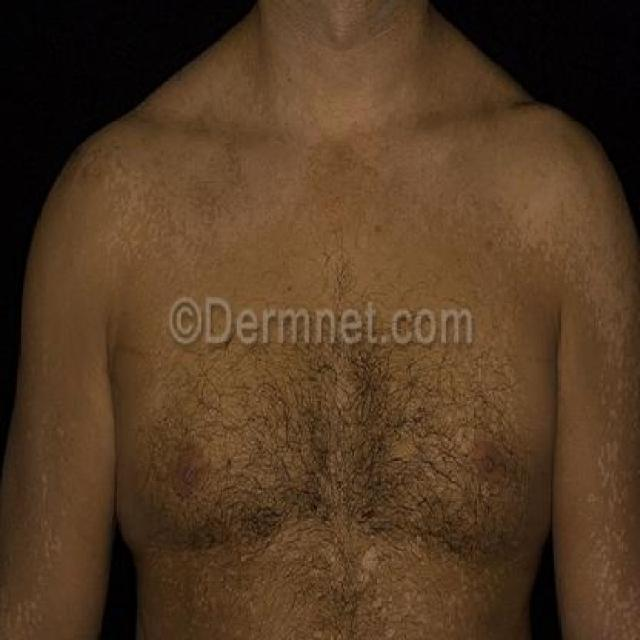

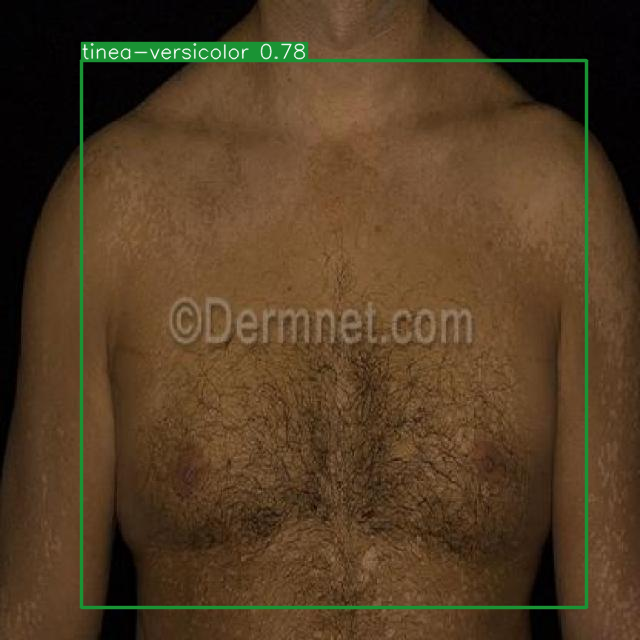


0: 416x416 1 Psoriasis, 191.7ms
Speed: 3.1ms preprocess, 191.7ms inference, 4.3ms postprocess per image at shape (1, 3, 416, 416)


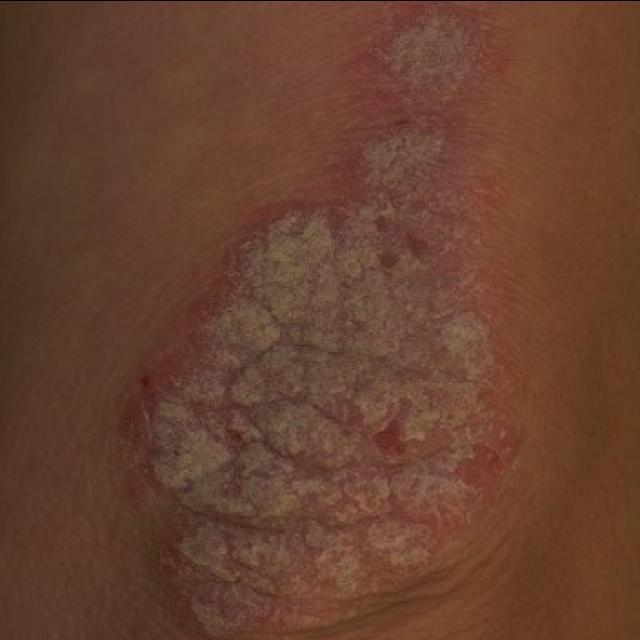

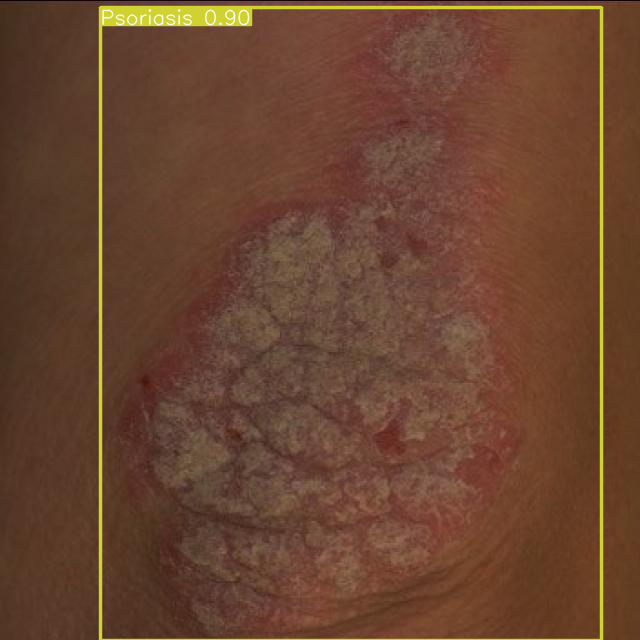


0: 416x416 14 Acnes, 201.8ms
Speed: 3.0ms preprocess, 201.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 416)


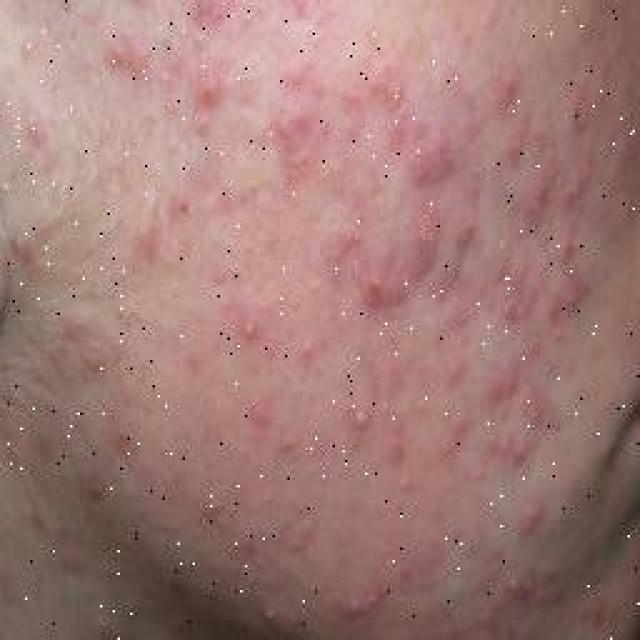

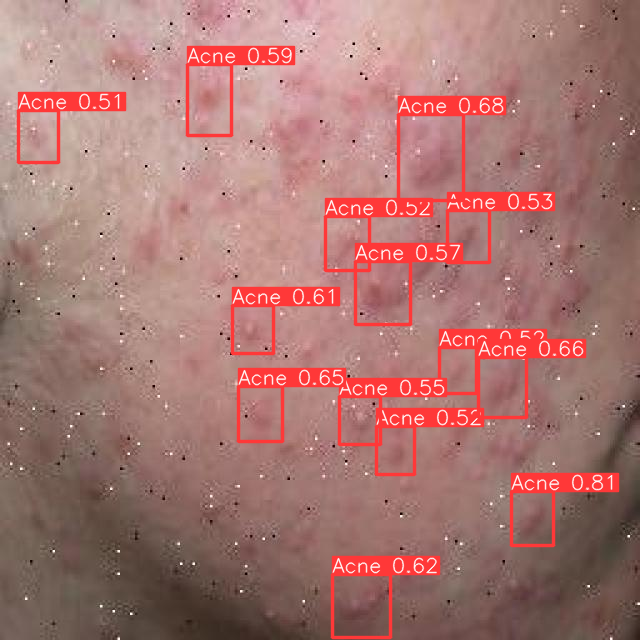


0: 416x416 1 vitiligo, 189.4ms
Speed: 3.6ms preprocess, 189.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)


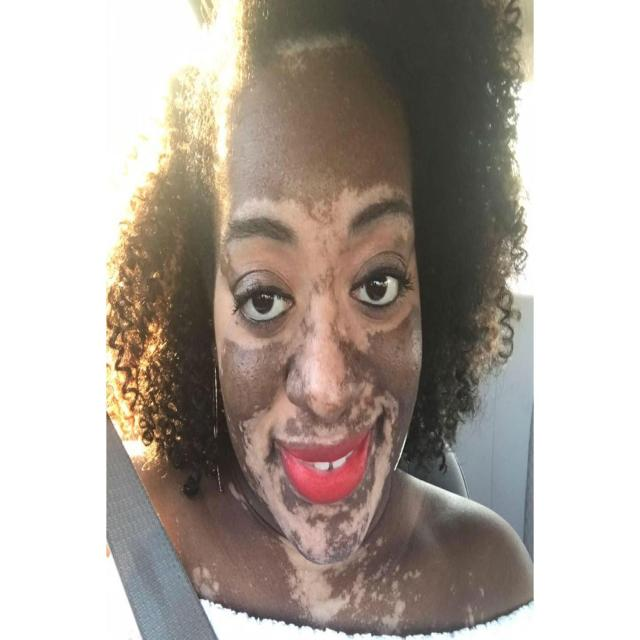

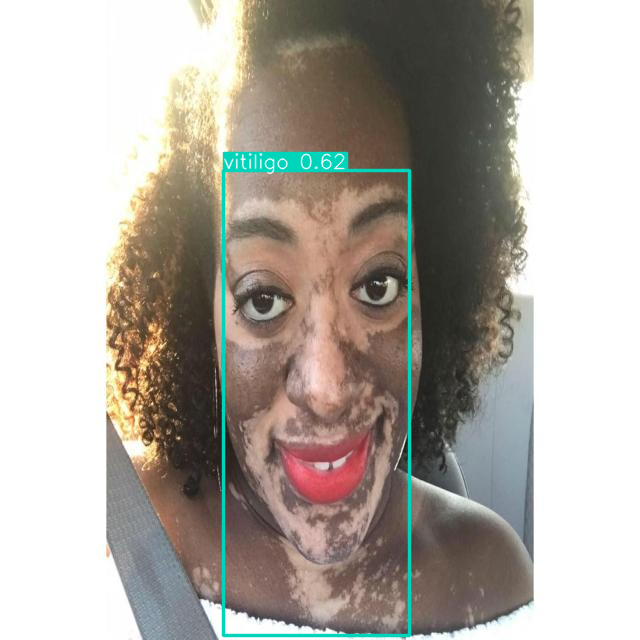

In [ ]:
from PIL import Image
from IPython.display import display

# Path to the directory containing the images
image_dir = '/content/Skin-1/test/images'

# Get a list of all image files in the directory
image_files = [os.path.join(image_dir, file) for file in os.listdir(image_dir) if file.endswith('.jpg')]

# Randomly select 10 images from the directory
random_images = random.sample(image_files, k=10)

# Create a directory to save the results
save_dir = '/kaggle/working/yolo_results'
os.makedirs(save_dir, exist_ok=True)

for image_path in random_images:
    # Read the image using PIL to ensure correct format for YOLO
    image = Image.open(image_path).convert('RGB')
    image_np = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)

    # Use the YOLO model to predict objects in the image
    results = best_model.predict([image_np], save_dir=save_dir, imgsz=416, conf=0.5, iou=0.7)

    # Display the original image
    display(image)

    # Display the image with bounding boxes
    plot = results[0].plot()
    plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
    display(Image.fromarray(plot))

In [ ]:
!yolo task=detect mode=train model=yolov8m.pt data=/content/FY23-3/data.yaml epochs=90 imgsz=640

100% 49.7M/49.7M [00:00<00:00, 183MB/s]
Ultralytics YOLOv8.1.39 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/FY23-3/data.yaml, epochs=90, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, sho